# `Football Analytics`

### Import libraries

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import requests
from mplsoccer import Pitch, Sbopen, VerticalPitch

### Prepare the data

In [2]:
FRA_COLOR = '#3C5B6F'
ARG_COLOR = '#83B4FF'

In [3]:
parser  = Sbopen()
competitions = parser.competition()
competitions.head()

,competition_id,season_id,country_name,competition_name,competition_gender,competition_youth,competition_international,season_name,match_updated,match_updated_360,match_available_360,match_available
0,9,281,Germany,1. Bundesliga,male,False,False,2023/2024,2024-05-21T03:36:44.090970,2024-05-21T03:38:27.534702,2024-05-21T03:38:27.534702,2024-05-21T03:36:44.090970
1,9,27,Germany,1. Bundesliga,male,False,False,2015/2016,2024-05-19T11:11:14.192381,None,None,2024-05-19T11:11:14.192381
2,1267,107,Africa,African Cup of Nations,male,False,True,2023,2024-02-28T18:02:23.493027,None,None,2024-02-28T18:02:23.493027
3,16,4,Europe,Champions League,male,False,False,2018/2019,2024-05-13T13:14:25.239651,2021-06-13T16:17:31.694,None,2024-05-13T13:14:25.239651
4,16,1,Europe,Champions League,male,False,False,2017/2018,2024-02-13T02:35:28.134882,2021-06-13T16:17:31.694,None,2024-02-13T02:35:28.134882


In [4]:
df, df_related, df_freeze, df_tactics = parser.event(3869685)

In [5]:
df['player_name'] = df['player_name'].apply(lambda x: x.replace('Lionel Andrés Messi Cuccittini', 'Lionel Messi') if x == 'Lionel Andrés Messi Cuccittini' else x)
df['player_name'] = df['player_name'].apply(lambda x: x.replace('Rodrigo Javier De Paul', 'Rodrigo De Paul') if x == 'Rodrigo Javier De Paul' else x)
df['player_name'] = df['player_name'].apply(lambda x: x.replace('Nicolás Hernán Otamendi', 'Nicolas Otamendi') if x == 'Nicolás Hernán Otamendi' else x)
df['player_name'] = df['player_name'].apply(lambda x: x.replace('Aurélien Djani Tchouaméni', 'Tchouameni') if x == 'Aurélien Djani Tchouaméni' else x)
df['player_name'] = df['player_name'].apply(lambda x: x.replace('Cristian Gabriel Romero', 'Cristian Romero') if x == 'Cristian Gabriel Romero' else x)
df['player_name'] = df['player_name'].apply(lambda x: x.replace('Nicolás Alejandro Tagliafico', 'Nicolas Tagliafico') if x == 'Nicolás Alejandro Tagliafico' else x)
df['player_name'] = df['player_name'].apply(lambda x: x.replace('Kylian Mbappé Lottin', 'Kylian Mbappe') if x == 'Kylian Mbappé Lottin' else x)
df['player_name'] = df['player_name'].apply(lambda x: x.replace('Nahuel Molina Lucero', 'Molina') if x == 'Nahuel Molina Lucero' else x)
df['player_name'] = df['player_name'].apply(lambda x: x.replace('Theo Bernard François Hernández', 'Theo Hernandez') if x == 'Theo Bernard François Hernández' else x)
df['player_name'] = df['player_name'].apply(lambda x: x.replace('Ángel Fabián Di María Hernández', 'Angel Di Maria') if x == 'Ángel Fabián Di María Hernández' else x)
df['player_name'] = df['player_name'].apply(lambda x: x.replace('Randal Kolo Muani', 'Kolo Muani') if x == 'Randal Kolo Muani' else x)
df['player_name'] = df['player_name'].apply(lambda x: x.replace('Damián Emiliano Martínez', 'Emiliano Martinez') if x == 'Damián Emiliano Martínez' else x)
df['player_name'] = df['player_name'].apply(lambda x: x.replace('Gonzalo Ariel Montiel', 'Montiel') if x == 'Gonzalo Ariel Montiel' else x)
df['player_name'] = df['player_name'].apply(lambda x: x.replace('Leandro Daniel Paredes', 'Leandro Paredes') if x == 'Leandro Daniel Paredes' else x)
df['player_name'] = df['player_name'].apply(lambda x: x.replace('Lautaro Javier Martínez', 'Lautaro Martinez') if x == 'Lautaro Javier Martínez' else x)
df['player_name'] = df['player_name'].apply(lambda x: x.replace('Paulo Bruno Exequiel Dybala', 'Paulo Dybala') if x == 'Paulo Bruno Exequiel Dybala' else x)
df['player_name'] = df['player_name'].apply(lambda x: x.replace('Germán Alejandro Pezzella', 'Alejandro Pezzella') if x == 'Germán Alejandro Pezzella' else x)
df['player_name'] = df['player_name'].apply(lambda x: x.replace('Dayotchanculle Upamecano', 'Upamecano') if x == 'Dayotchanculle Upamecano' else x)

### Draw the pitch

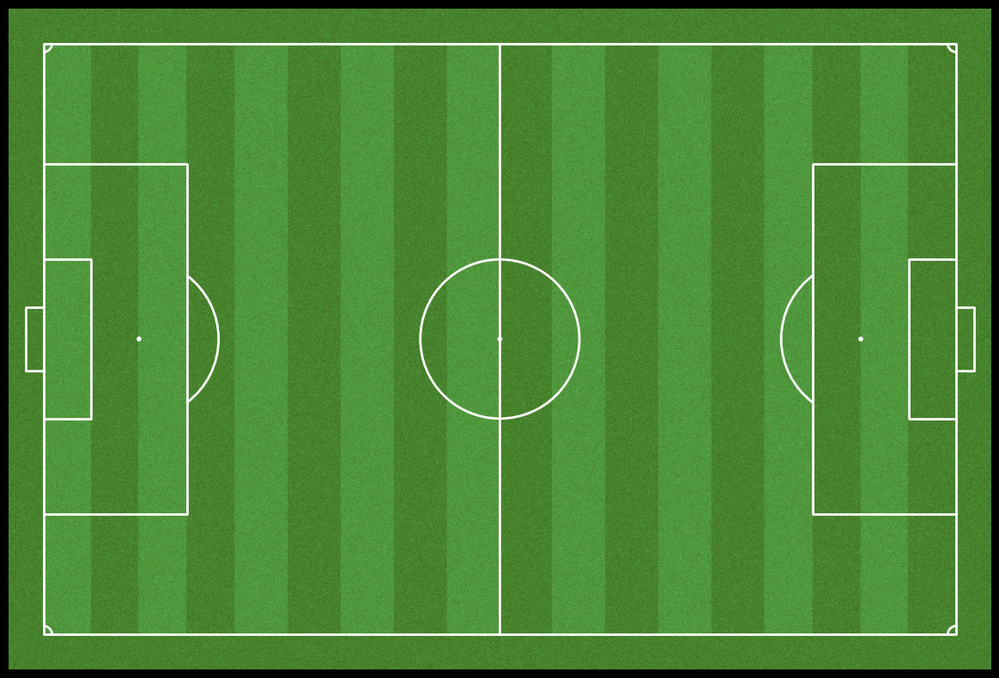

In [6]:
fig, ax = plt.subplots(figsize=(15, 10))
fig.set_facecolor('black')
ax.patch.set_facecolor('black')

pitch = Pitch(pitch_type='uefa', pitch_color='grass', line_color='white', goal_type='box', stripe=True, corner_arcs=True)
pitch.draw(ax=ax)

plt.show()

### Player Pass Map

In [7]:
passes = df.loc[df['type_name'] == 'Pass'].loc[df['sub_type_name'] != 'Throw-in'].set_index('id')

def drawPassMap(playername, color='purple'):
    mask_bronze = (df.type_name == 'Pass') & (df.player_name == playername)
    df_pass = df.loc[mask_bronze, ['x', 'y', 'end_x', 'end_y']]

    pitch = Pitch(pitch_type='statsbomb', pitch_color='grass', line_color='white', goal_type='box', stripe=True, corner_arcs=True)
    
    fig, ax = plt.subplots(figsize=(15, 10))
    fig.set_facecolor('black')
    
    pitch.arrows(df_pass.x, df_pass.y,
                 df_pass.end_x, df_pass.end_y, color=color, ax=ax)
    pitch.scatter(df_pass.x, df_pass.y, alpha=0.3, s=300, color="white", ax=ax)
    pitch.draw(ax=ax)
    
    fig.suptitle(playername + "'s Pass Map", fontsize=24, fontweight='bold', fontfamily='Comic Sans MS', color='white')
    plt.show()


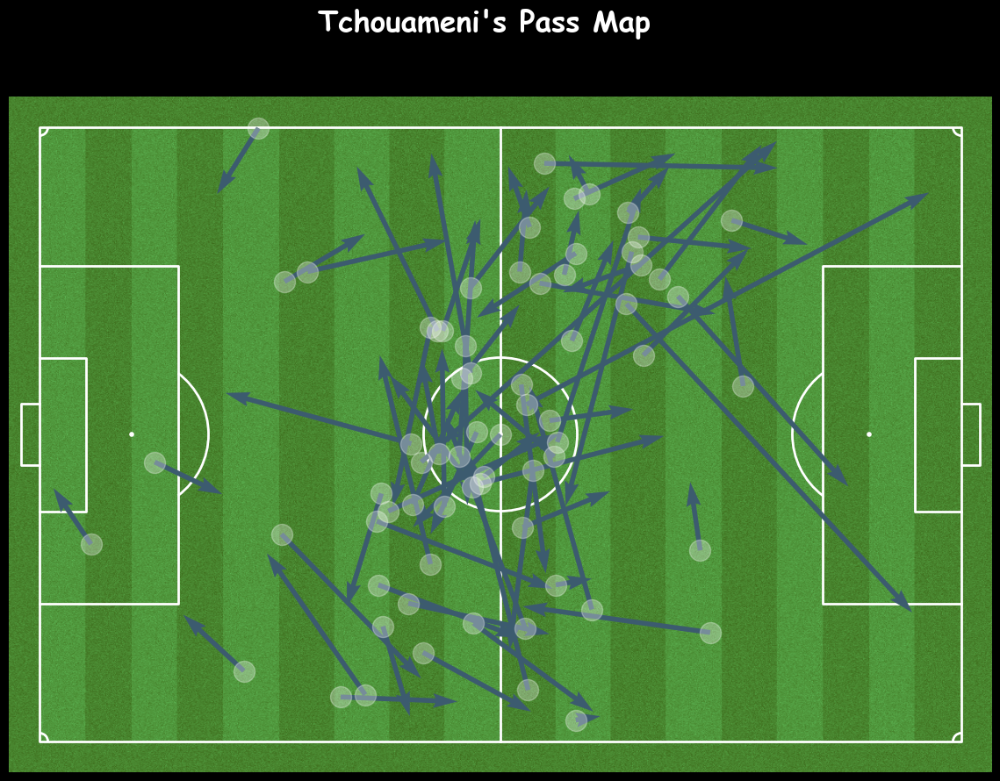

In [8]:
drawPassMap("Tchouameni", color=FRA_COLOR)

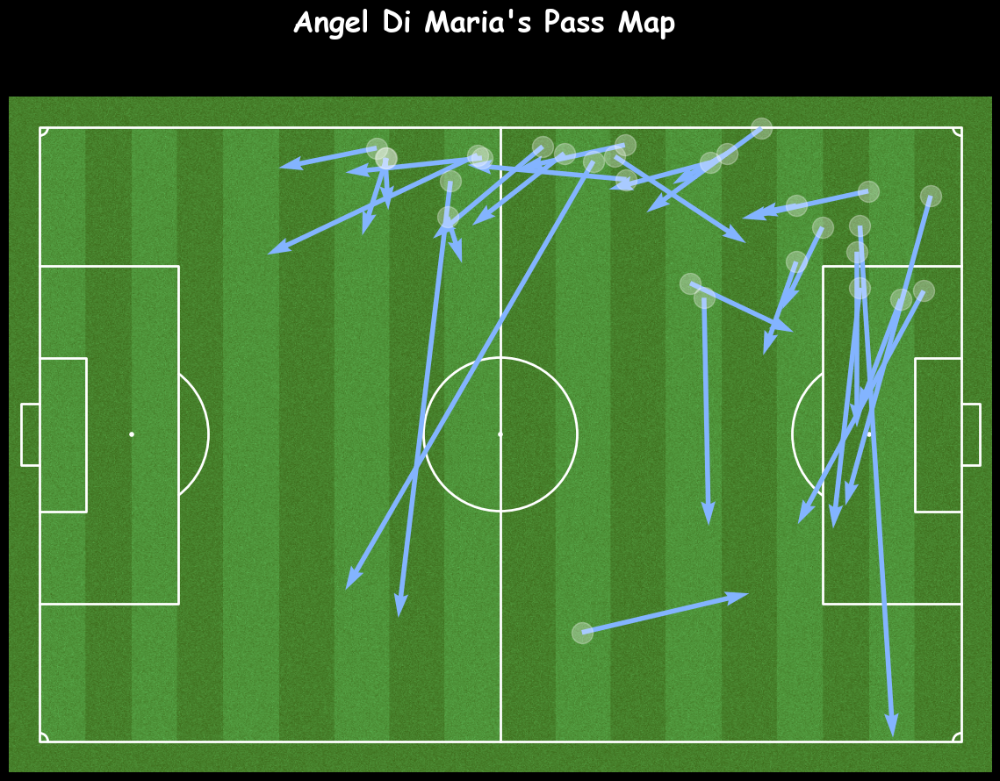

In [9]:
drawPassMap("Angel Di Maria", color=ARG_COLOR)

### Teamwise Pass Map

In [10]:
def drawTeamPass(team, color='black'):
    mask_team = (df.type_name == 'Pass') & (df.team_name == team) & (df.sub_type_name != "Throw-in")
    df_pass = df.loc[mask_team, ['x', 'y', 'end_x', 'end_y', 'player_name']]
    names = df_pass['player_name'].unique()

    n_col = 4
    n_row = int(np.ceil(len(names) / n_col))

    pitch = Pitch(line_color='black', pitch_type='statsbomb', pitch_color='grass', linewidth=1, line_alpha=0.5, pad_bottom=3)
    
    fig, axes = plt.subplots(n_row, n_col, figsize=(15, 10))
    
    plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=1.3, 
                    )
    fig.set_facecolor('white')
    ax = axes.ravel()

    for index, name in enumerate(names):
        ax[index].set_title(name, ha='center', va='center', fontsize=14)
        ax[index].axis('off')
        player_df = df_pass.loc[df_pass['player_name'] == name]
    
        pitch.arrows(player_df.x, player_df.y, player_df.end_x, player_df.end_y, width=1, color=color, ax=ax[index])
        pitch.scatter(player_df.x, player_df.y, alpha=0.3, s=10, color="black", ax=ax[index])
        pitch.draw(ax=ax[index])

    for i in range(len(axes.ravel()) - index):
        ax[index+i].axis('off')

    plt.show()

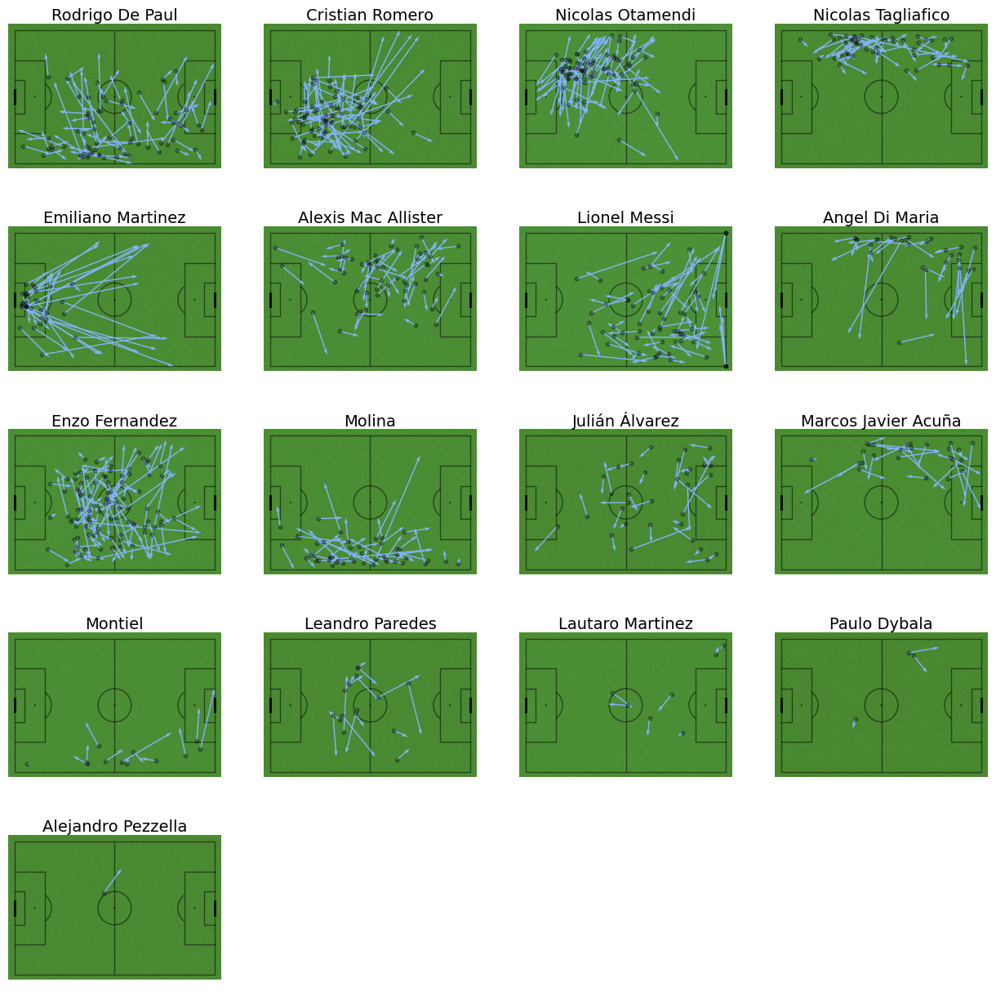

In [11]:
drawTeamPass('Argentina', color=ARG_COLOR)

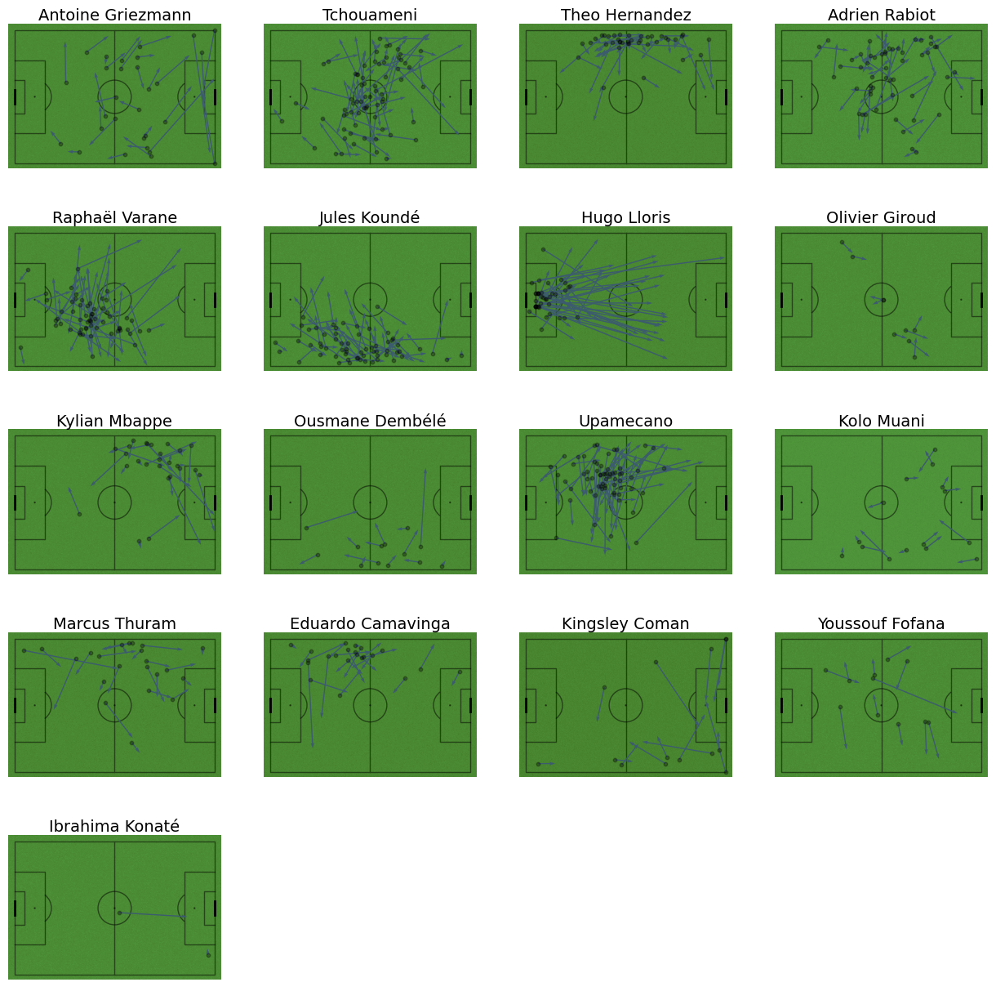

In [12]:
drawTeamPass('France', color=FRA_COLOR)

### Player Possession Heat Map

In [13]:
def drawHeatMap(player_name):
    fig, ax = plt.subplots(figsize=(15, 10))
    fig.set_facecolor('black')
    ax.patch.set_facecolor('black')

    player_mask = (df.type_name == 'Carry') & (df.player_name == player_name)
    player_df = df.loc[player_mask, ['x', 'y', 'end_x', 'end_y']]

    pitch = Pitch(pitch_type='uefa', pitch_color='grass', line_color='white', goal_type='box', stripe=True, corner_arcs=True)
    pitch.draw(ax=ax)

    pitch.kdeplot(x=player_df['x'], y=player_df['y'], fill=True, shade_lowest=False, 
                  alpha=.5, cmap='plasma', ax=ax)

    plt.show()

    

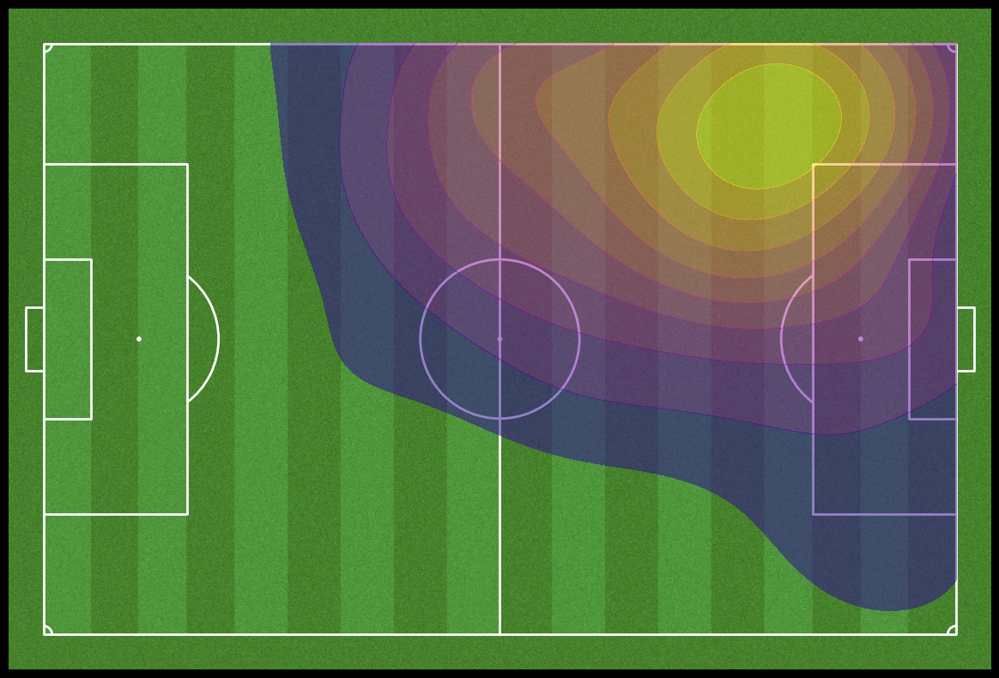

In [14]:
drawHeatMap('Lionel Messi')

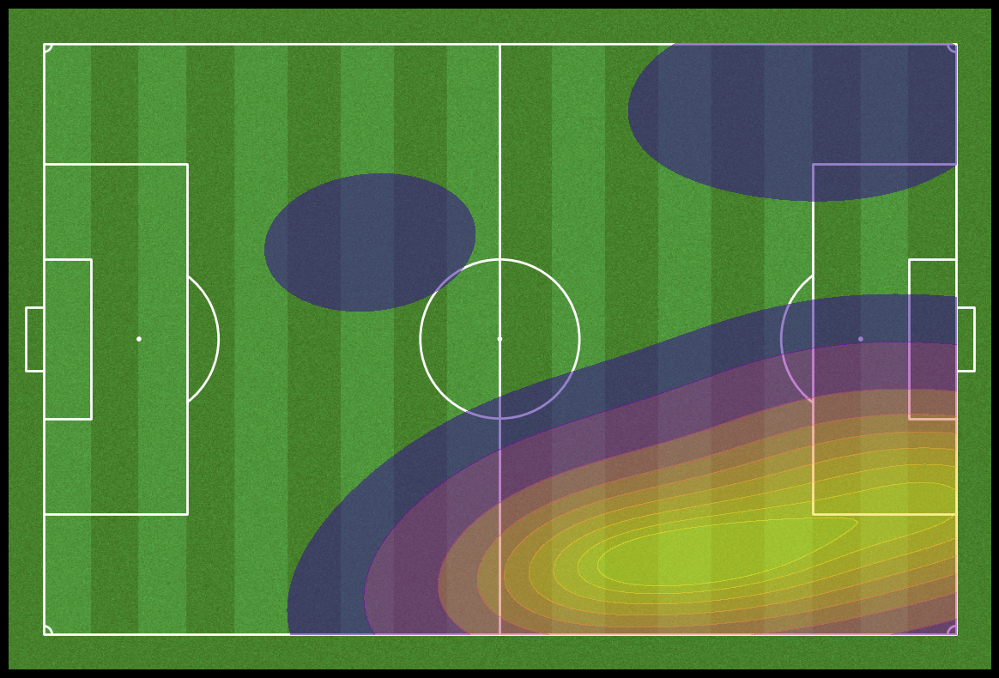

In [15]:
drawHeatMap('Kylian Mbappe')

### Team Possession Heat Map

In [27]:
def drawTeamPose(team):
    mask_team = (df.type_name == 'Carry') & (df.team_name == team)
    df_pose = df.loc[mask_team, ['x', 'y', 'end_x', 'end_y', 'player_name']]
    names = df_pose['player_name'].unique()

    n_col = 4
    n_row = int(np.ceil(len(names) / n_col))

    pitch = Pitch(line_color='black', pitch_type='statsbomb', pitch_color='grass', linewidth=1, line_alpha=0.5, pad_bottom=3)
    
    fig, axes = plt.subplots(n_row, n_col, figsize=(15, 10))

    fig.set_facecolor('white')
    ax = axes.ravel()

    for index, name in enumerate(names):
        
        pitch.draw(ax=ax[index], tight_layout=True)
        ax[index].set_title(name, ha='center', va='center', fontsize=14)
        ax[index].axis('off')

        if (name == 'Olivier Giroud'):
            continue
        
        player_df = df_pose.loc[df_pose['player_name'] == name]
        pitch.kdeplot(x=player_df['x'], y=player_df['y'], fill=True, shade_lowest=False, 
                  alpha=.5, cmap='plasma', ax=ax[index])
        

    for i in range(len(axes.ravel()) - index):
        ax[index+i].axis('off')

    fig.suptitle('Possession Map', fontsize=24, fontweight='bold', fontfamily='Comic Sans MS')
    plt.show()

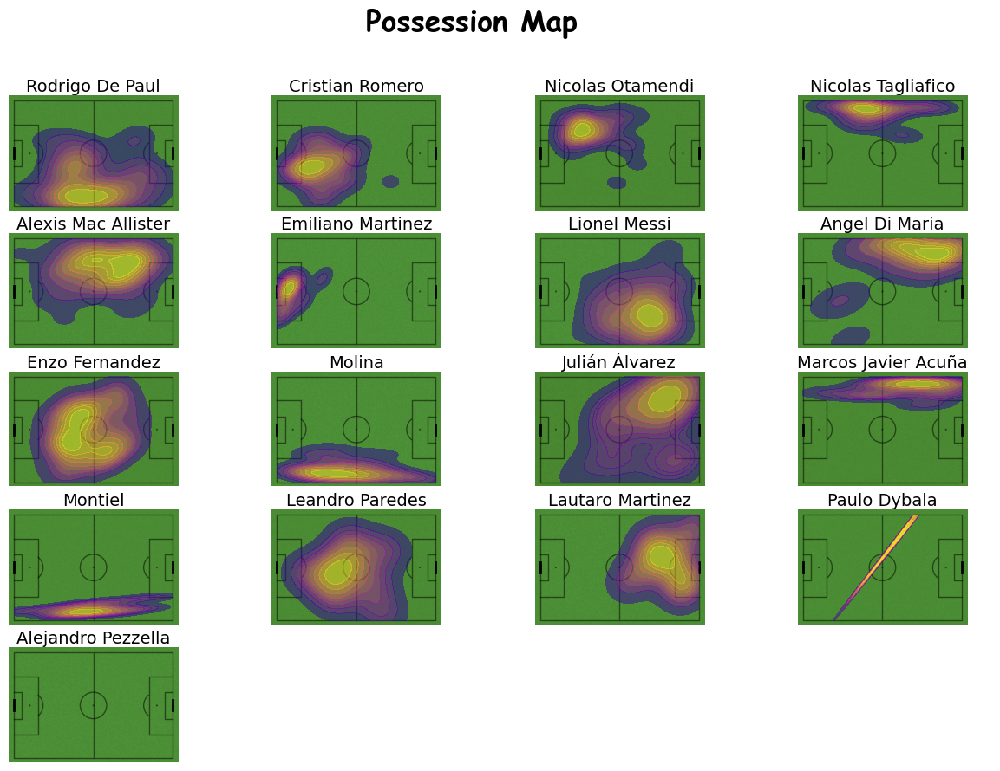

In [28]:
drawTeamPose('Argentina')

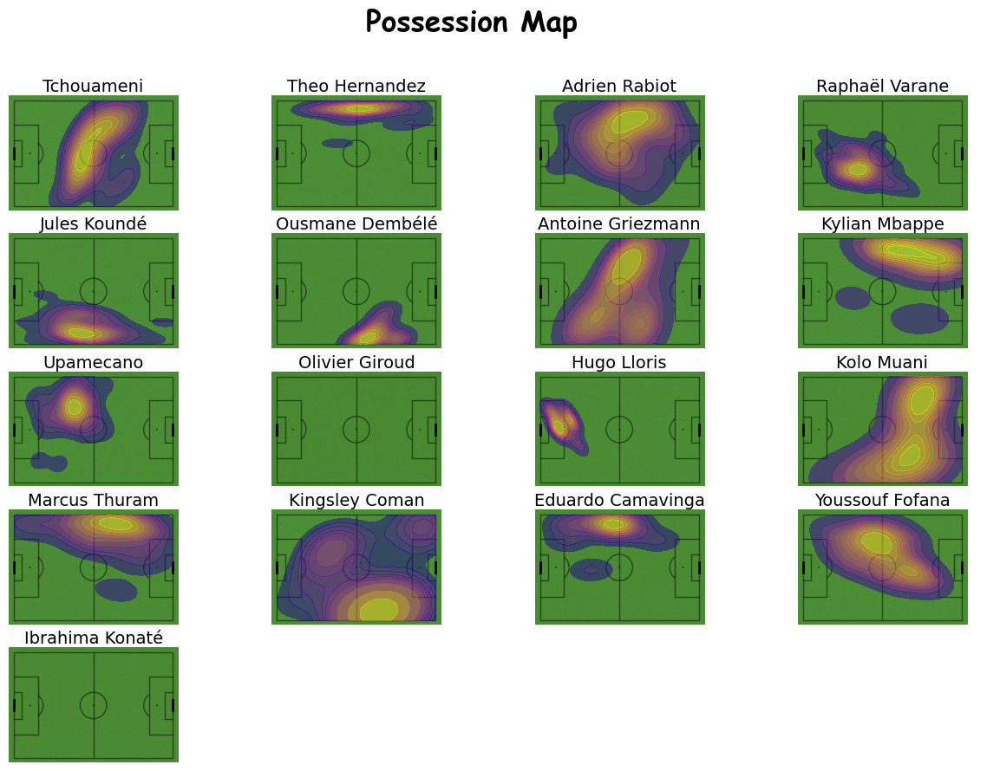

In [29]:
drawTeamPose('France')

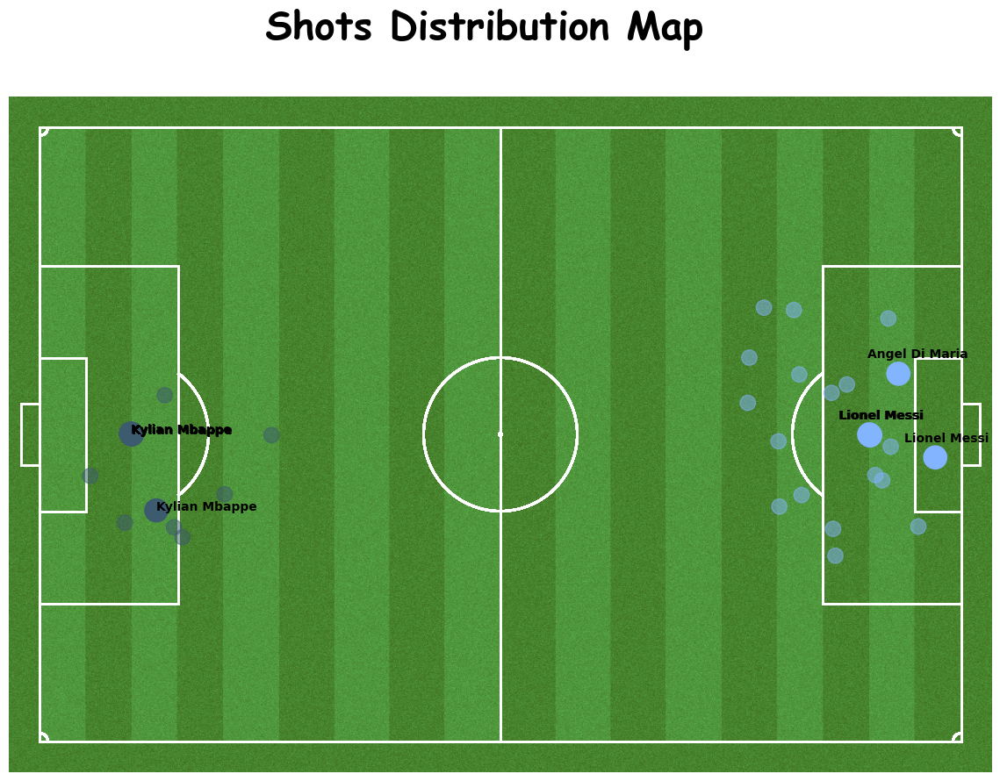

In [32]:
shots_df = df[df.type_name == 'Shot']
scorers = ['Kylian Mbappe', 'Lionel Messi', 'Angel Di Maria']

fig, ax = plt.subplots(figsize=(15, 10))
pitch = Pitch(pitch_color='grass', line_color='white', goal_type='box', stripe=True, 
              pitch_type='statsbomb', corner_arcs=True)

for index, shot in shots_df.iterrows():
    goal = shot['outcome_name'] == 'Goal'
    team = shot['team_name']

    if (team == 'Argentina'):
        if goal:
            point = plt.Circle((shot.x, shot.y), 1.5, color=ARG_COLOR)
            if shot.player_name in scorers:
                plt.text((shot.x-4), shot.y-2, shot.player_name, fontdict={'fontweight': 'bold'})

        else:
            point = plt.Circle((shot.x, shot.y), 1, color=ARG_COLOR)
            point.set_alpha(.5)

    if (team == 'France'):
        if goal:
            point = plt.Circle((120-shot.x, 80-shot.y), 1.5, color=FRA_COLOR)
            if shot.player_name in scorers:
                plt.text((120-shot.x), 80-shot.y, shot.player_name, fontdict={'fontweight': 'bold'})

        else:
            point = plt.Circle((120-shot.x, 80-shot.y), 1, color=FRA_COLOR)
            point.set_alpha(.5)

    pitch.draw(ax=ax)
    ax.add_patch(point)

fig.suptitle('Shots Distribution Map', fontsize=32, fontweight='bold', fontfamily='Comic Sans MS')
plt.show()